In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import gdown
from wordcloud import WordCloud
import plotly.express as px
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

nltk.download('stopwords')

url = 'https://drive.google.com/uc?id=1nONpng5xOXNr2kK-bdtLL4RsaingezVK'  
dataset = "Reviews.csv"
# Descargar el archivo CSV
# gdown.download(url, dataset, quiet=False)
df = pd.read_csv(dataset)

print(df.info())


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\monst\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568428 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   Summary                 568427 non-null  object
 9   Text                    568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB
None


In [81]:
#Leer datos generales del dataframe

df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [82]:
fig = px.histogram(df, x='Score', title="Scores", labels={'Score': 'Score'})

# Mostrar el gráfico
fig.show()



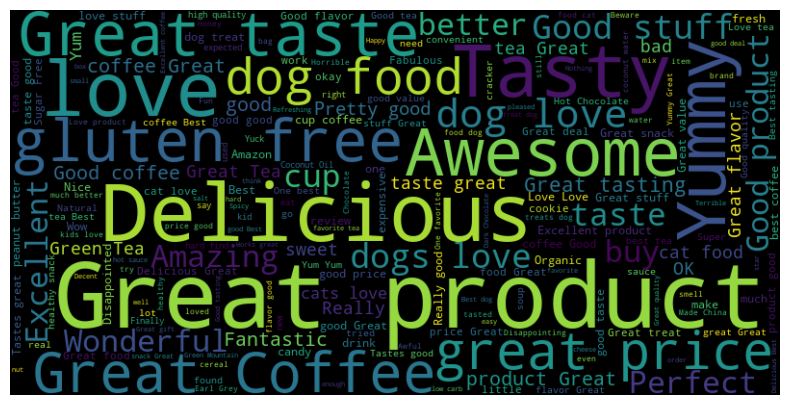

In [83]:
# Crear una WordCloud
df['Summary'] = df['Summary'].astype(str)
text = ' '.join(df['Summary'])
stop_words = set(stopwords.words('english'))
text = ' '.join([word for word in text.split() if word.lower() not in stop_words])
wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate(text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()



In [84]:
# Score > 3 = +1, Score < 3 = -1 y Score = 3 = Neutro (Se elimina)
df = df[df['Score'] != 3]
df['Sentiment'] = df['Score'].apply(lambda x: 1 if x > 3 else -1)

score_freq = df['Score'].value_counts()
print("\nTabla de frecuencia de score despues de eliminar los neutros:")
print(score_freq)
df.info()

# Separar reviews positivaS y negativas en dos dataframes
df_pos = df[df['Sentiment'] == 1]
df_neg = df[df['Sentiment'] == -1]



Tabla de frecuencia de score despues de eliminar los neutros:
Score
5    363122
4     80655
1     52268
2     29769
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 525814 entries, 0 to 568453
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      525814 non-null  int64 
 1   ProductId               525814 non-null  object
 2   UserId                  525814 non-null  object
 3   ProfileName             525788 non-null  object
 4   HelpfulnessNumerator    525814 non-null  int64 
 5   HelpfulnessDenominator  525814 non-null  int64 
 6   Score                   525814 non-null  int64 
 7   Time                    525814 non-null  int64 
 8   Summary                 525814 non-null  object
 9   Text                    525814 non-null  object
 10  Sentiment               525814 non-null  int64 
dtypes: int64(6), object(5)
memory usage: 48.1+ MB


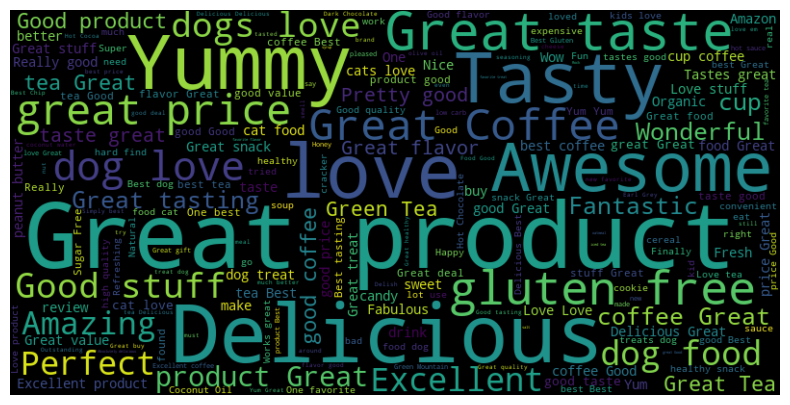

In [85]:
# Crear una nube de palabras para las reseñas positivas
text_pos = ' '.join(df_pos['Summary'])
stop_words = set(stopwords.words('english'))
text_pos = ' '.join([word for word in text_pos.split() if word.lower() not in stop_words])
wordcloud_pos = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate(text_pos)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_pos, interpolation='bilinear')
plt.axis('off')  
plt.show()

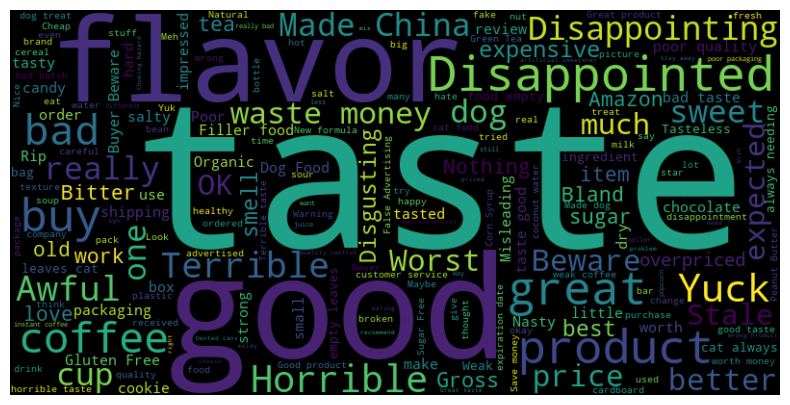

In [86]:
# Crear una nube de palabras para las reseñas negativas
text_neg = ' '.join(df_neg['Summary'])
stop_words = set(stopwords.words('english'))
text_neg = ' '.join([word for word in text_neg.split() if word.lower() not in stop_words])
wordcloud_neg = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate(text_neg)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_neg, interpolation='bilinear')
plt.axis('off')  
plt.show()

In [87]:
#Grafico del conteo de reseñas positivas y negativas
fig = px.histogram(df, x=df['Sentiment'].replace({1: 'positive', -1: 'negative'}), title='Product Sentiment', color=df['Sentiment'].replace({1: 'positive', -1: 'negative'}), labels={'x': 'Sentiment'},
category_orders={'x': ['positive', 'negative']})
fig.show()

In [90]:
# Limpiando el dataset
df_c= df[['Summary','Sentiment']]
df_c['Summary'] = df_cleaned['Summary'].str.replace(r'[^\w\s]', '', regex=True)
print("\nDataframe limpio:")
print(df_c.head())



Dataframe limpio:
                 Summary  Sentiment
0  Good Quality Dog Food          1
1      Not as Advertised         -1
2    Delight says it all          1
3         Cough Medicine         -1
4            Great taffy          1


In [91]:
# Dividir dataframe en train y test
train_df, test_df = train_test_split(df, test_size=0.2, random_state=32)

In [92]:
# Creacion de Bag of Words
vectorizer = CountVectorizer()
summary = vectorizer.fit_transform(train_df['Summary'])
summary_test = vectorizer.transform(test_df['Summary'])

sentiment = train_df['Sentiment']
sentiment_test = test_df['Sentiment']

print(f'Tamaño de la bolsa de palabras: {len(vectorizer.get_feature_names_out())}')


Tamaño de la bolsa de palabras: 36622


In [93]:
# Creacion de Modelo
model = LogisticRegression(max_iter=300, solver='saga')
model.fit(summary, sentiment)

predictions = model.predict(summary_test)

conf_matrix = confusion_matrix(sentiment_test, predictions)

In [96]:
#Imprimit matriz de confusion e Informe de clasificacion
print("\nMatriz de confusion:")
print(conf_matrix)

print("\nInforme de clasificacion:")
print(classification_report(sentiment_test, predictions))


Matriz de confusion:
[[10794  5437]
 [ 2208 86724]]

Informe de clasificacion:
              precision    recall  f1-score   support

          -1       0.83      0.67      0.74     16231
           1       0.94      0.98      0.96     88932

    accuracy                           0.93    105163
   macro avg       0.89      0.82      0.85    105163
weighted avg       0.92      0.93      0.92    105163

